<a href="https://colab.research.google.com/github/scraus/test-yolov5/blob/main/initial_results_without_augmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Clone YOLOv5
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -qr requirements.txt

import torch
import utils
display = utils.notebook_init()

YOLOv5 🚀 v7.0-56-gc0ca1d2 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 23.1/78.2 GB disk)


In [3]:
from google.colab import drive 
drive.mount('/content/gdrive')

# Retrieve dataset
!unzip '/content/gdrive/MyDrive/dataset/mask_usage_dataset_without_aug.zip' -d 'mask_usage_dataset_without_aug'

Mounted at /content/gdrive
Archive:  /content/gdrive/MyDrive/dataset/mask_usage_dataset_without_aug.zip
 extracting: mask_usage_dataset_without_aug/README.dataset.txt  
 extracting: mask_usage_dataset_without_aug/README.roboflow.txt  
 extracting: mask_usage_dataset_without_aug/data.yaml  
   creating: mask_usage_dataset_without_aug/test/
   creating: mask_usage_dataset_without_aug/test/images/
 extracting: mask_usage_dataset_without_aug/test/images/0_not_covered-110-_jpeg.rf.f98b3bd6b23165a9d6eec5644e3c54e7.jpg  
 extracting: mask_usage_dataset_without_aug/test/images/0_not_covered-114-_jpeg.rf.2ede716aab332a6f68f08cadff388e19.jpg  
 extracting: mask_usage_dataset_without_aug/test/images/0_not_covered-115-_jpeg.rf.4a71e06399f78907030da7d3a3b74d2f.jpg  
 extracting: mask_usage_dataset_without_aug/test/images/0_not_covered-132-_jpeg.rf.13747434043f6e4d41c590bc1b3e6373.jpg  
 extracting: mask_usage_dataset_without_aug/test/images/0_not_covered-137-_jpeg.rf.ce6097c282cbadf3456150196637e45

In [4]:
# Train
!python train.py --img 640 --batch 4 --epochs 300 --data data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=4, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-56-gc0ca1d2 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degr

In [5]:
!zip -r /content/exp_results.zip /content/yolov5/runs/train/exp

  adding: content/yolov5/runs/train/exp/ (stored 0%)
  adding: content/yolov5/runs/train/exp/results.csv (deflated 84%)
  adding: content/yolov5/runs/train/exp/labels_correlogram.jpg (deflated 29%)
  adding: content/yolov5/runs/train/exp/train_batch1.jpg (deflated 6%)
  adding: content/yolov5/runs/train/exp/weights/ (stored 0%)
  adding: content/yolov5/runs/train/exp/weights/best.pt (deflated 9%)
  adding: content/yolov5/runs/train/exp/weights/last.pt (deflated 9%)
  adding: content/yolov5/runs/train/exp/val_batch1_pred.jpg (deflated 13%)
  adding: content/yolov5/runs/train/exp/val_batch2_labels.jpg (deflated 13%)
  adding: content/yolov5/runs/train/exp/PR_curve.png (deflated 16%)
  adding: content/yolov5/runs/train/exp/train_batch0.jpg (deflated 5%)
  adding: content/yolov5/runs/train/exp/labels.jpg (deflated 26%)
  adding: content/yolov5/runs/train/exp/train_batch2.jpg (deflated 6%)
  adding: content/yolov5/runs/train/exp/opt.yaml (deflated 49%)
  adding: content/yolov5/runs/train/ex



---



# Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.


In [6]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

#Run Inference  With Trained Weights

In [7]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source mask_usage_dataset_without_aug/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=mask_usage_dataset_without_aug/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-56-gc0ca1d2 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/156 /content/yolov5/mask_usage_dataset_without_aug/test/images/0_not_covered-110-_jpeg.rf.f98b3bd6b23165a9d6eec5644e3c54e7.jpg: 416x384 1 not_covered, 12.7ms
image 2/156 /content/yolov5/mask_usage_dataset_without_aug/test/images/0_not_covered-114-_jpeg.rf.2ede716aab332a6f68f08cadff388e19.jpg: 416x352 1 not_covered, 

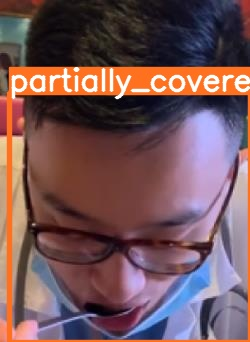

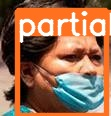

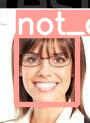

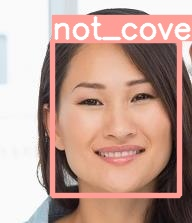

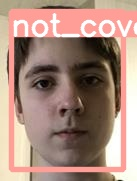

...

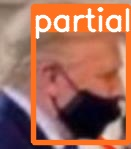

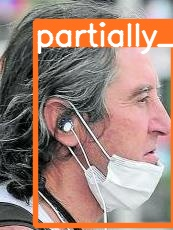

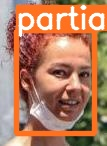

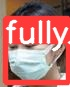

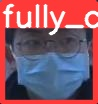

In [8]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [9]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [19]:
!python detect.py --source 0

detect: weights=yolov5s.pt, source=0, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-56-gc0ca1d2 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()

[ WARN:0@5.068] global /io/opencv/modules/videoio/src/cap_v4l.cpp (902) open VIDEOIO(V4L2:/dev/video0): can't open camera by index
Traceback (most recent call last):
  File "detect.py", line 261, in <module>
    main(opt)
  File "detect.py", line 256, in main
    run(**vars(opt))
  File "/usr/local/lib/python3.8/dist-package